### Importando

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import time

### Defining constants

In [2]:
AU = (149.6e9)

### The body class

In [3]:
class Body:
    ## All vectors are decomposed in x-axis and y-axis
    ## p = (x,y) -> Actual Position Vector
    ## v = (x,y) -> Actual Velocity Vector
    ## pos_x -> List of all x-axis positions over time
    ## pos_y -> List of all y-axis positions over time
    ## color -> Orbit trace and planet color
    
    def __init__(self, name_of = 'UNNAMED', color_of = 'gray'):
        self.name = name_of
        self.color = color_of
        
    mass = 0
    v_x = v_y = v_x0 = v_y0 = 0
    p_x = p_y = p_x0 = p_y0 = 0
    pos_x = []
    pos_y = []
    kinetic = 0
    potential = 0
    momentum = 0

    def acceleration(self, bodies, pos = [0,0], retangle = False, retpe = False, G = 6.67428e-11, retm = False):
        acc_x = acc_y = 0
        pe = 0
        ke = 0
        for other in bodies:
            if self is other:
                continue
            d_x = (other.p_x - pos[0])
            d_y = (other.p_y - pos[1])
            d = math.sqrt(d_x**2 + d_y**2) ## Calculate the distance between the bodies
            if d == 0:
                raise ValueError('The bodies %r and %r collided' %(self.name, other.name))
            
            ## Compute acceleration OTHER causes on THIS
            acc = G * other.mass / d**2
            
            ## Compute potential Energy
            if retpe:
                pe += G * other.mass * self.mass / d
                ke += 1/2 * self.mass * (self.v_x**2 + self.v_y**2)
                energy = ke - pe
            ## Decomposing the acceleration on x-axis and y-axis
            theta = math.atan2(d_y, d_x)
            a_x = acc*math.cos(theta)
            a_y = acc*math.sin(theta)
            acc_x += a_x
            acc_y += a_y
            
        if retm: 
            v = self.v_x**2 + self.v_y**2 #v^2
            dsun = self.p_x**2 + self.p_y**2
            try:
                momentum = math.sqrt(dsun * (self.mass**2 * v) - (self.p_x * self.v_x * self.mass + self.mass * self.p_y * self.v_y)**2)
            except:
                momentum = 0
        if retangle and retpe and retm:
            return acc_x, acc_y, energy, momentum
        else:
            return acc_x, acc_y

### Simulation

In [4]:
def simulate(bodies, step = 3600, period = 365, method = 'euler', G = 6.67428e-11):
    count = 0
    pos = {}
    energy = {}
    momentum = {}
    for body in bodies:
        pos[body.name] = []
        energy[body.name] = []
        momentum[body.name] = []
        ## Routine that resets body position state in each simulation
        body.p_x = body.p_x0
        body.p_y = body.p_y0
        body.v_x = body.v_x0
        body.v_y = body.v_y0
        
    while count < period:
        acc = {}
        for body in bodies:
            acc_x = acc_y = 0
            for other in bodies:
                if body is other:
                    continue
                acc_x, acc_y, body.energy, body.momentum = body.acceleration(bodies, pos = [body.p_x, body.p_y], retm = True, retangle = True, retpe = True)
                acc[body] = (acc_x, acc_y)

        for body in bodies:
            pos[body.name].append((body.p_x,body.p_y))
            energy[body.name].append(body.energy)
            momentum[body.name].append(body.momentum)
            
            a_x, a_y = acc[body]
            
            if method == 'euler-cromer':
            ## Sympletic 1st-order Euler
                body.v_x += a_x * step
                body.v_y += a_y * step

                body.p_x += body.v_x * step
                body.p_y += body.v_y * step
            elif method == 'velocity-verlet':
            ## Velocity Verlet / Leapfrog - Sympletic 2nd-order methods
                vhalf_x = body.v_x +  0.5 * step * a_x
                vhalf_y = body.v_y +  0.5 * step * a_y
                
                body.p_x += vhalf_x * step
                body.p_y += vhalf_y * step
                
                ax_new, ay_new = body.acceleration(bodies, pos = [body.p_x, body.p_y])
                
                body.v_x = vhalf_x + ax_new * 0.5 * step
                body.v_y = vhalf_y + ay_new * 0.5 * step
            
            elif method == 'position-verlet':
            ## Velocity Verlet / Leapfrog - Sympletic 2nd-order methods
                phalf_x = body.p_x +  0.5 * step * body.v_x
                phalf_y = body.p_y +  0.5 * step * body.v_y
                
                ax_new, ay_new = body.acceleration(bodies, pos = [phalf_x, phalf_y])
                
                body.v_x += ax_new * step
                body.v_y += ay_new * step
                
                body.p_x = phalf_x + body.v_x * step/2
                body.p_y = phalf_y + body.v_y * step/2
            
            elif method == 'leapfrog':
                w = 2**(1./3.)
                f = 2 - w
                
                lf1 = (0.5 * step / f)
                p1_x = body.p_x + lf1 * body.v_x
                p1_y = body.p_y + lf1 * body.v_y
                
                ax_new, ay_new = body.acceleration(bodies, pos = [p1_x, p1_y])
                
                lf2 = step / f
                v2_x = body.v_x + lf2 * ax_new
                v2_y = body.v_y + lf2 * ay_new
                
                lf3 = (1 - w) * step * 0.5 / f
                p3_x = p1_x + lf3 * v2_x
                p3_y = p1_y + lf3 * v2_y
                
                ax_new, ay_new = body.acceleration(bodies, pos = [p3_x, p3_y])
                
                lf4 = -step * w / f
                v4_x = v2_x + lf4 * ax_new
                v4_y = v2_y + lf4 * ay_new
                
                p5_x = p3_x + lf3 * v4_x
                p5_y = p3_y + lf3 * v4_y
                
                ax_new, ay_new = body.acceleration(bodies, pos = [p5_x, p5_y])
                
                body.v_x = v4_x + lf2 * ax_new
                body.v_y = v4_y + lf2 * ay_new
                
                body.p_x = p5_x + lf1 * body.v_x
                body.p_y = p5_y + lf1 * body.v_y
                
            else:
            ## 1st-order Euler
                body.p_x += body.v_x * step
                body.p_y += body.v_y * step
                
                body.v_x += a_x * step
                body.v_y += a_y * step
        count += 1
    return pos, energy, momentum

### Plotter

In [5]:
def orbit_plotter(pos, bodies, title = 'Orbits', scale = False, color = False):
    for b in bodies:
        b.pos_x = [i[0] for i in pos[b.name]]
        b.pos_y = [i[1] for i in pos[b.name]]
    
    plt.figure(figsize=(10,10))
    
    for b in bodies:
        plt.plot(b.pos_x, b.pos_y, label = b.name, color = b.color, linestyle=':' )
        plt.scatter(b.pos_x[-1],b.pos_y[-1], color = b.color)
    
    plt.legend()
    plt.grid(alpha=0.2)

    
    ax = plt.gca()
    if color:
        ax.set_facecolor('black')
    ticks = ticker.FuncFormatter(lambda x, pos: '{0:.2f}'.format(x/AU))
    ax.xaxis.set_major_formatter(ticks)
    ax.yaxis.set_major_formatter(ticks)
    plt.xlabel('Latitudinal distance in AU')
    plt.ylabel('Longitudinal distance in AU')
        
    plt.title(title)
    plt.show()
    return ax

In [ ]:
(108747859.3**2 + 6450489.855**2)**0.5

In [6]:
sun = Body('Sun', 'yellow')
sun.mass = 1.98855e30
sun.size = 20

earth = Body('Earth', 'darkblue')
earth.mass = 5.9742e24
earth.p_x0 = 152.1e9
earth.v_y0 = 29.783e3
earth.size = 1

venus = Body('Venus', 'salmon')
venus.mass = 4.8685e24
venus.p_x0 = 108.9e9
venus.v_y0 = -35.02e3
venus.size = 0.95
    
mercury = Body('Mercury', 'darkmagenta')
mercury.mass = 0.3e24
mercury.p_x0 = 69.8e9
mercury.v_y0 = 47.7e3
mercury.size = 0.38
    
mars = Body('Mars', 'r')
mars.mass = 0.642e24
mars.p_x0 = 249.2e9
mars.v_y0 = 24.1e3
mars.size = 0.53
    
jupiter = Body('Jupiter', 'orangered')
jupiter.mass = 1.898e27
jupiter.p_x0 = 816.6e9
jupiter.v_y0 = 13.1e3
jupiter.size = 11.2
    
saturn = Body('Saturn', 'maroon')
saturn.mass = 5.68e26
saturn.p_x0 = 1514.5e9
saturn.v_y0 = 9.7e3
saturn.size = 9.45
    
uranus = Body('Uranus', 'darkgreen')
uranus.mass = 8.6e25
uranus.p_x0 = 3003.6e9
uranus.v_y0 = 6.8e3
uranus.size = 4
    
neptune = Body('Neptune', 'navy')
neptune.mass = 1.02e26
neptune.p_x0 = 4545.7e9
neptune.v_y0 = 5.4e3
neptune.size = 3.8
    
halley = Body('Halley', 'white')
halley.mass = 1.02e14
halley.p_x0 = 5248.2672e9
halley.v_y0 = 1e3

pluto = Body('Pluto', 'magenta')
pluto.mass = 0.0146e24
pluto.p_x0 = 737.9e9
pluto.v_y0 = 4.7e3

## Defining Aphelions

In [ ]:
data_aphelions = { 'Mercury' : 69.8e6, 'Venus' : 108.9e6, 'Earth': 152.1e6, 'Mars' : 249.2e6, 'Jupiter' : 816.6e6, 'Saturn' : 1514.5e6, 'Uranus' : 3003.6e6, 'Neptune' : 4545.7e6, 'Pluto' : 737.9e6}
data_perihelions = {'Mercury' : 46e6, 'Venus' : 107.5e6, 'Earth': 147.1e6, 'Mars' : 206.6e6, 'Jupiter' : 740.5e6, 'Saturn' : 1352.6e6, 'Uranus' : 2741.3e6, 'Neptune' : 4444.5e6, 'Pluto' : 4436.8e6}

### Full Solar System

In [7]:
bodies = [sun, mercury, venus, earth, mars, jupiter, saturn, uranus, neptune]
bodies_jp = [sun, earth, venus, mars, mercury, jupiter]
bodies_inner = [sun, earth, venus, mars, mercury]
bodies_outter = [sun, jupiter, saturn, uranus, neptune]

## Names of Planets

In [8]:
bodies_names = [i.name for i in bodies]

### Conversion

3600 s - 1 hr <br>
100.000 hrs - 11.4 yrs

100.000 periodos rodam em 2.5min

10.000 rodando em 11s

In [63]:
def big_simulation(methods = ['euler'], steps = [3600], t = 1000, bod = bodies):
    pos = {}
    energy = {}
    momentum = {}
    for m in methods:
        pos[m] = []
        energy[m] = []
        momentum[m] = []
        for h in steps:
            ret_pos, ret_energy, ret_momentum = simulate(bod, period = t, method = m, step = h)
            pos[m].append([h, ret_pos])
            energy[m].append([h, ret_energy])
            momentum[m].append([h, ret_momentum])
    return pos, energy, momentum

def big_plotter(methods = ['euler'], steps = [3600], graph = ['orbit'], opt = [bodies, 'The Solar System']):
    t = len(pos['euler'][0][1]['Sun'])
    ts = np.linspace(0,2*t/24,t)
    for m in methods:
        if 'orbit' in graph:
                j = 0
                for h in steps:
                    orbit_plotter(pos[m][steps.index(h)][1], opt[0], title = opt[1] + ' - ' + m + ' - h = ' + str(h))
                    j += 1
        
        if 'energy' in graph:
            for b in opt[0][1:]:
                i = 0
                plt.figure(figsize=(12,8))
                for h in steps:
                    plt.plot(ts, energy2[m][i][1][b.name], label = 'h = ' + str(h) + ' $\Delta = $ '+ '{0:.3f}'.format((max(momentum2[m][i][1][b.name])/min(momentum2[m][i][1][b.name]) -1)*100) + '%')
                    i += 1
                plt.title(b.name + ' - ' + m)
                plt.xlabel('Days')
                plt.ylabel('Energy')
                plt.legend(loc = 1)
                plt.grid(alpha = 0.5)
                plt.show()
        if 'momentum' in graph:
            for b in opt[0][1:]:
                k = 0
                plt.figure(figsize=(12,8))
                for h in steps:
                    plt.plot(ts, momentum2[m][k][1][b.name], label =  'h = ' + str(h)  + ' $\Delta = $ '+ '{0:.2f}'.format((max(momentum2[m][k][1][b.name])/min(momentum2[m][k][1][b.name]) -1)*100) + '%')
                    k += 1
                plt.title(b.name + ' - ' + m)
                plt.xlabel('Days')
                plt.grid(alpha = 0.5)
                plt.ylabel('Angular Momentum')
                plt.legend(loc = 1)
                plt.show()

In [15]:
hs = [900, 1800, 3600, 7200]
m = ['euler', 'euler-cromer', 'velocity-verlet', 'leapfrog']

In [16]:
pos, energy, momentum = big_simulation(methods = m, t = 100000, steps = hs)

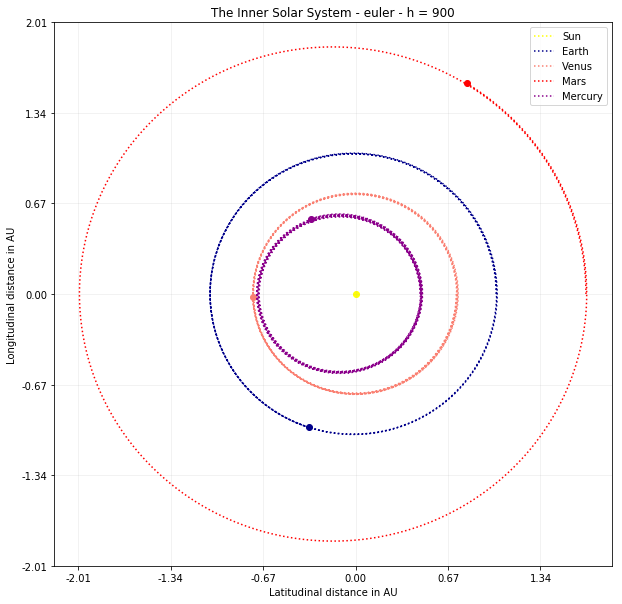

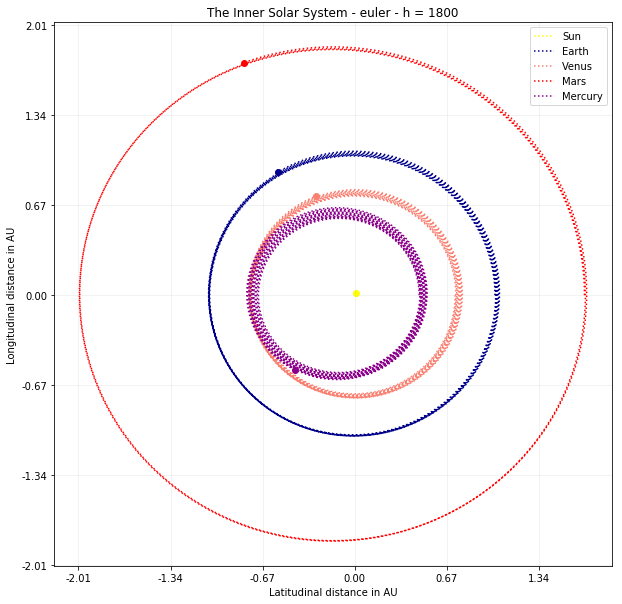

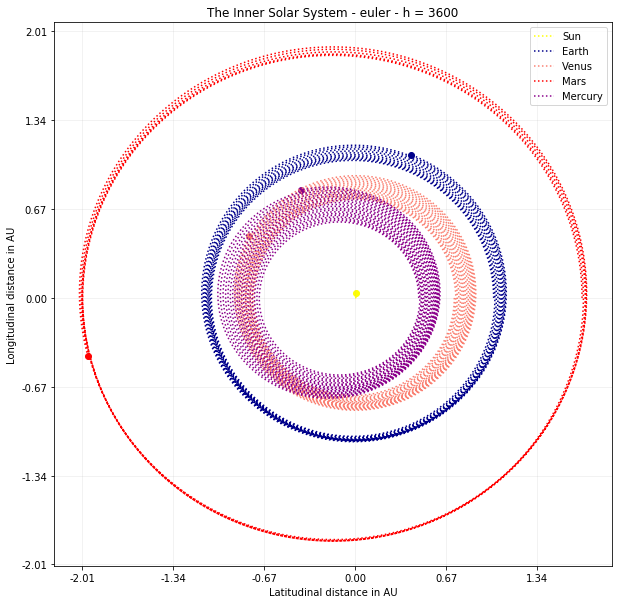

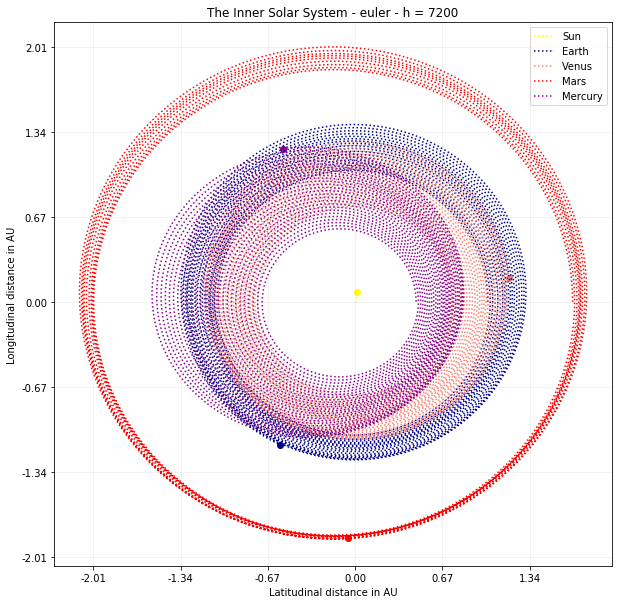

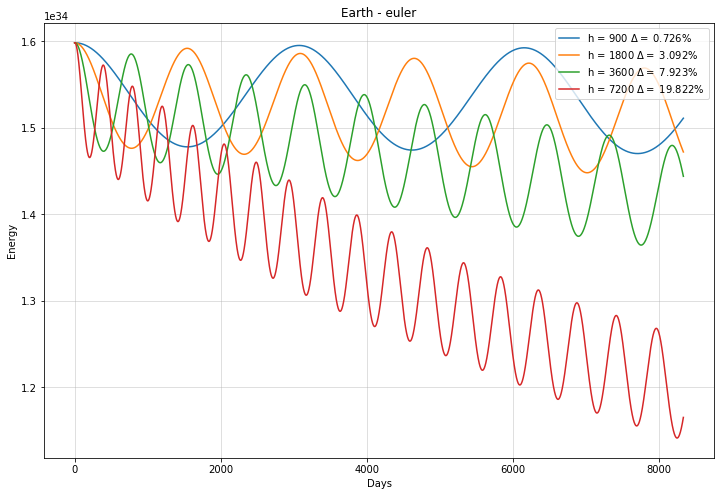

...

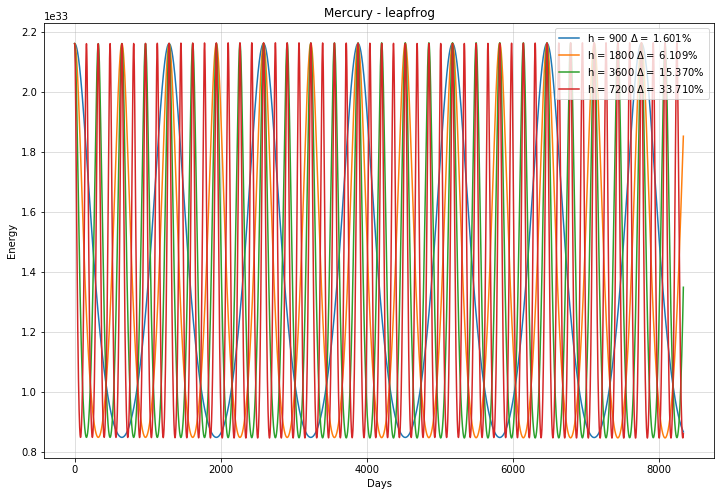

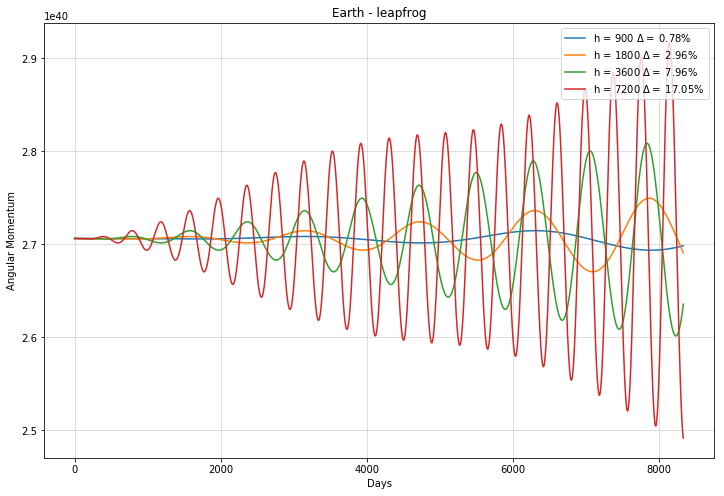

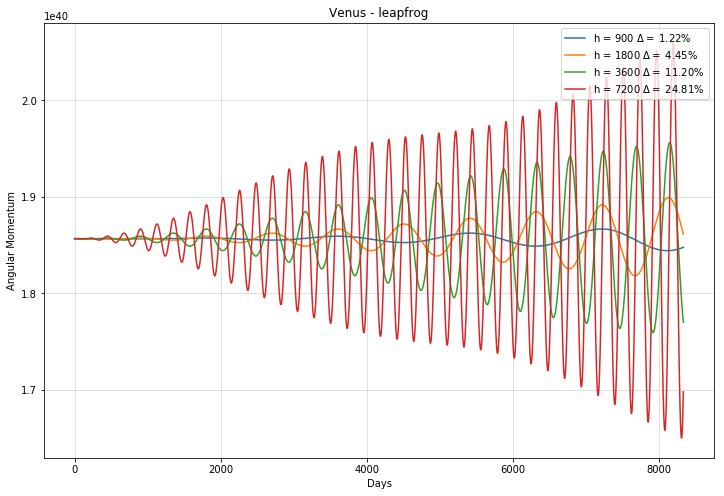

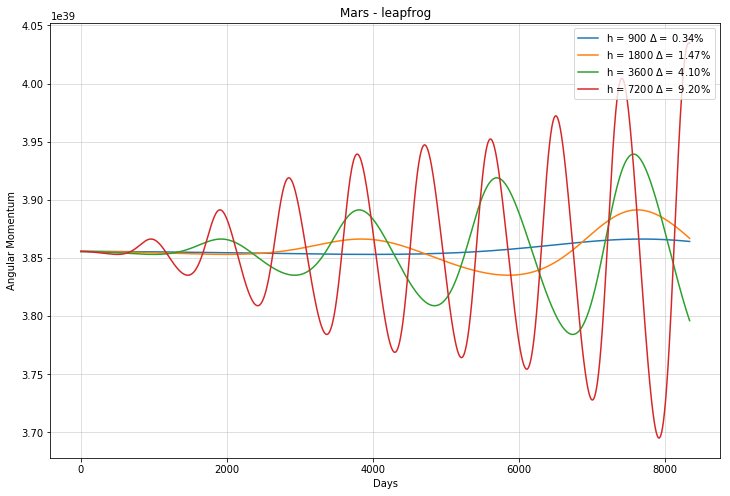

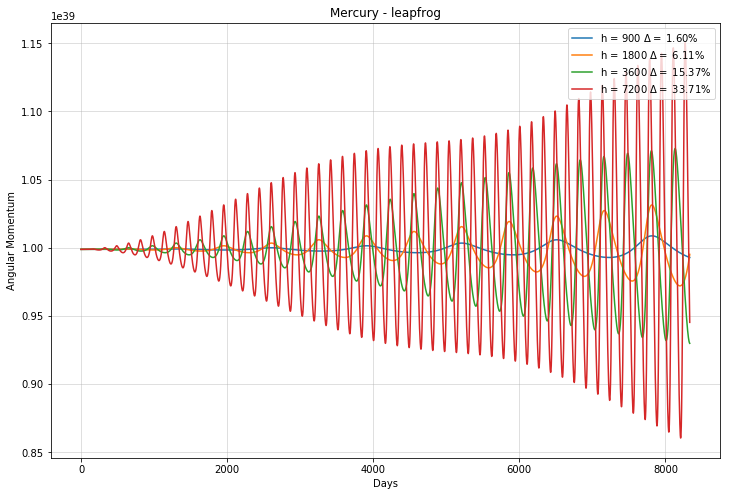

In [17]:
big_plotter(methods = m, steps = hs, graph = ['orbit','energy','momentum'], opt = [bodies_inner, 'The Inner Solar System'])

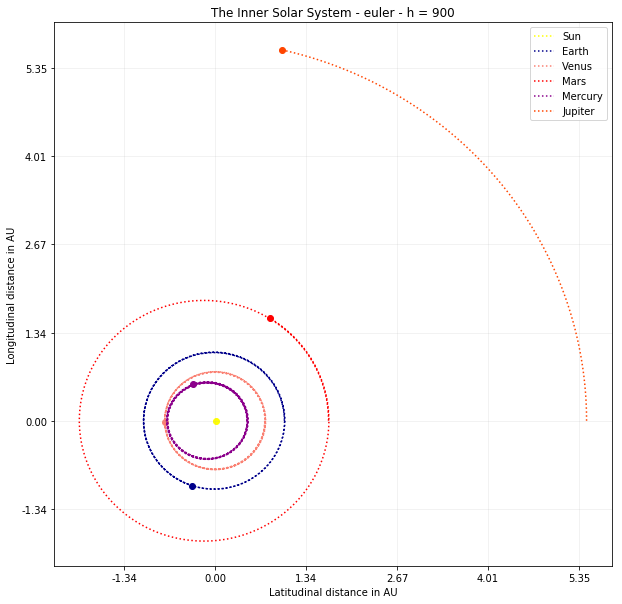

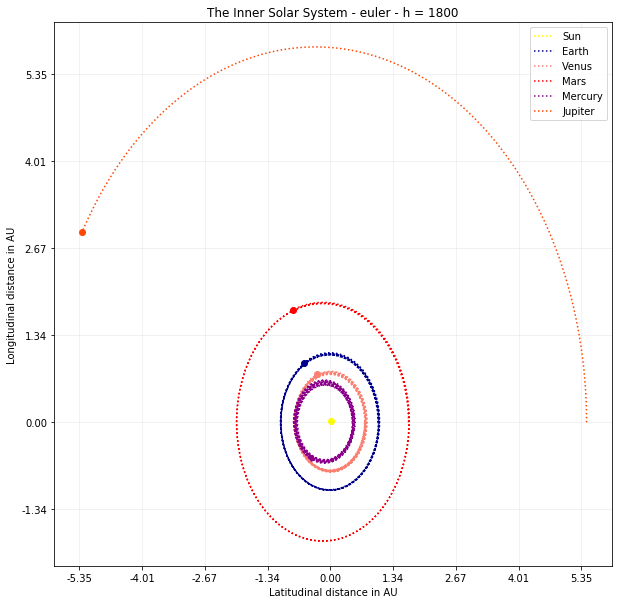

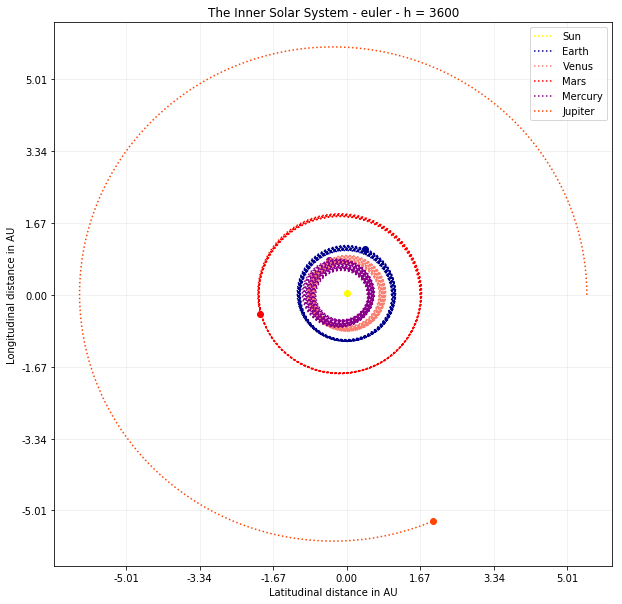

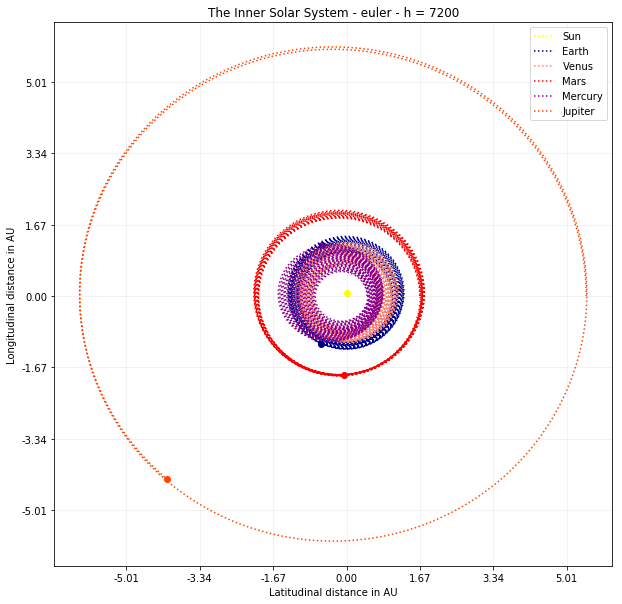

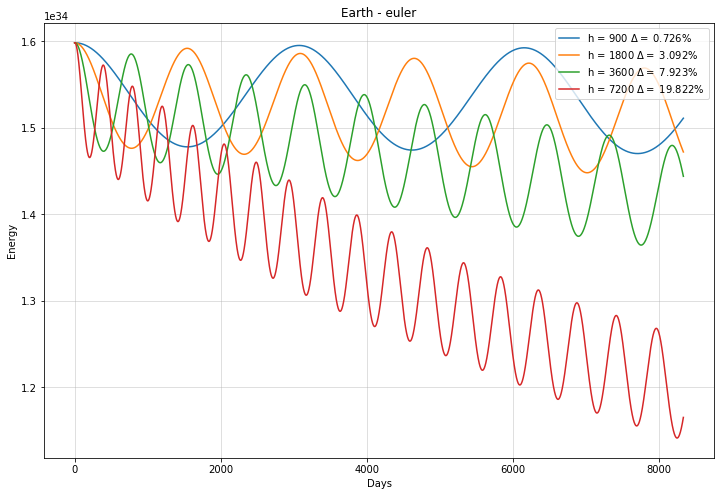

...

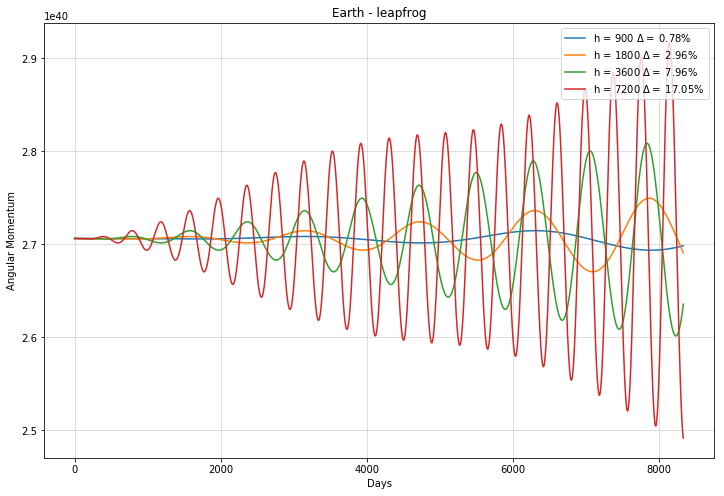

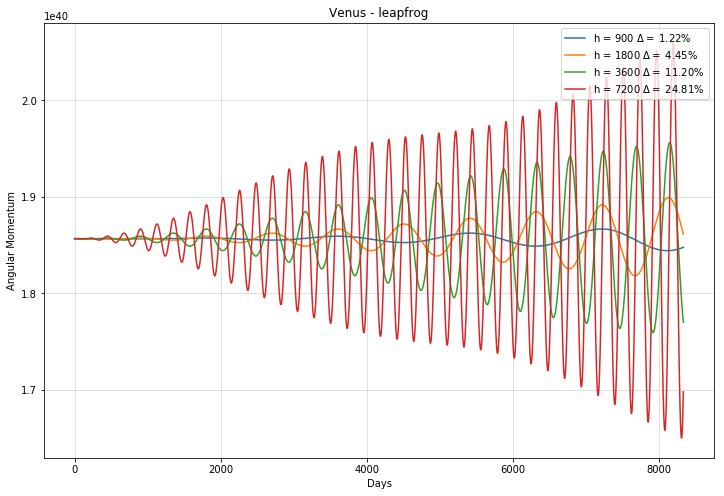

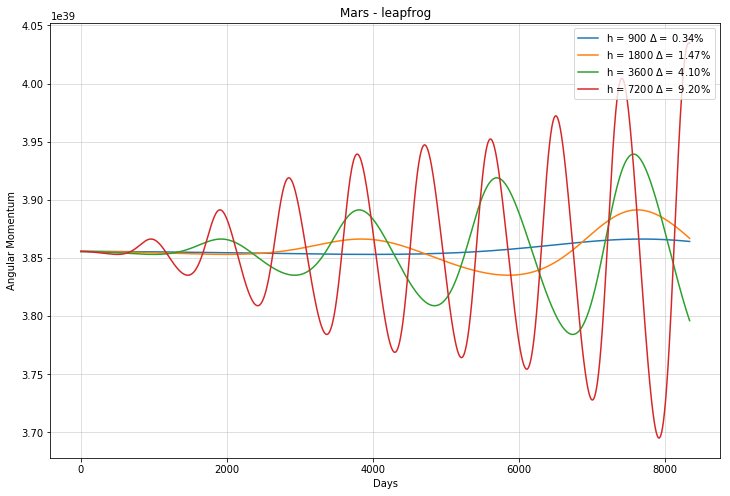

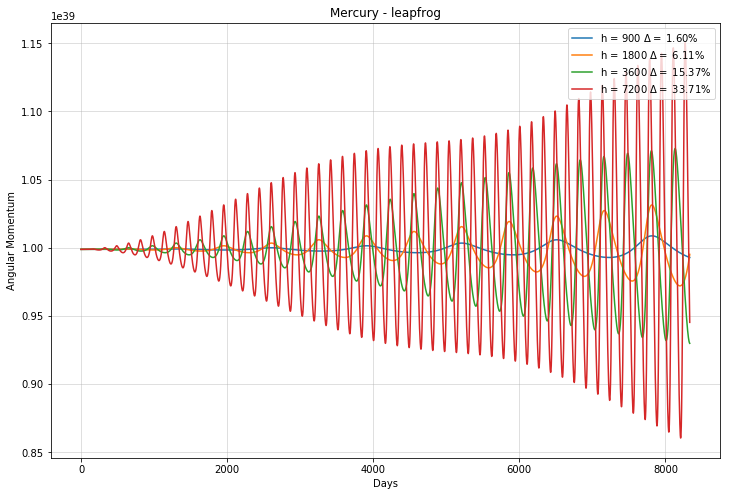

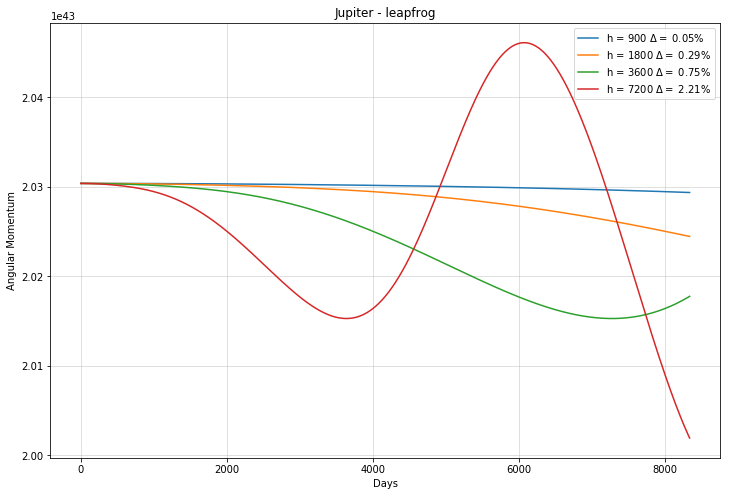

In [18]:
big_plotter(methods = m, steps = hs, graph = ['orbit','energy','momentum'], opt = [bodies_jp, 'The Inner Solar System'])

In [ ]:
start_time = time.time()
t = 15000
h = 3600
pos, angle, energy, momentum = simulate(bodies, period = t, method='leapfrog', step = h)
#plin = orbit_plotter(pos, bodies_inner, title='The Inner Solar System')
pl = orbit_plotter(pos, bodies_jp, title='The Inner Solar System')
#plout = orbit_plotter(pos, bodies, title='The Outer Solar System')
end_time = time.time()
print('A simulação foi feita em %s segundos' % (end_time - start_time))

In [ ]:
plin = orbit_plotter(pos['euler'][0][1], bodies_inner, title='The Inner Solar System')
#pl = orbit_plotter(pos, bodies_jp, title='The Inner Solar System')
plout = orbit_plotter(pos['euler-cromer'][0][1], bodies_inner, title='The Inner Solar System')

In [ ]:
ts = np.linspace(0,2*t/24,t)
for b in bodies_inner[1:]:
    plt.plot(ts, energy[b.name], color = b.color)
    plt.xlabel('Days')
    plt.ylabel('Total Energy $\cdot 10^{34}$')
    plt.title(b.name)
    plt.show()

In [ ]:
ts = np.linspace(0,2*t/24,t)
for b in bodies_inner[1:]:
    plt.plot(ts, momentum[b.name], color = b.color)
    plt.xlabel('Days')
    plt.ylabel('Total Energy $\cdot 10^{34}$')
    plt.title(b.name)
    plt.show()

In [ ]:
ts = np.linspace(0,2*t/24,t)
for b in bodies_inner[1:]:
    plt.plot(ts, momentum[b.name], color = b.color)
    plt.xlabel('Days')
    plt.ylabel('Total Energy $\cdot 10^{34}$')
    plt.title(b.name)
    plt.show()

In [ ]:
ts = np.linspace(0,2*t/24,t)
m = [0]*t
for b in bodies_inner:
    for i in range(0,len(momentum[b.name])):
        m[i] += momentum[b.name][i]

plt.plot(ts, m, color = b.color)
plt.xlabel('Days')
plt.ylabel('Total Energy $\cdot 10^{34}$')
plt.title('Sistema')
plt.show()

In [ ]:
dist = [i[1]**2+i[0]**2 for i in pos['Earth']]

In [ ]:
plt.plot(momentum['Earth'], dist)

In [26]:
def calc_aphelion(pos):
    aphelion = 0
    for i in pos:
        dist = math.sqrt(i[0]**2+i[1]**2)
        if dist > aphelion: aphelion = dist
    return aphelion

def calc_perihelion(pos):
    pherihelion = 50e20
    for i in pos:
        dist = math.sqrt(i[0]**2+i[1]**2)
        if dist < pherihelion: pherihelion = dist
    return pherihelion

def calc_ecc(ap, pe):
    e = (ap-pe)/(ap+pe)
    return e

In [35]:
pos['leapfrog'][2][1]

{'Earth': [(152100000000.0, 0),
  (152099962825.32224, 107218791.26038614),
  (152099851301.30814, 214437530.0930286),
  (152099665428.01526, 321656164.07363176),
  (152099405205.53958, 428874640.7779666),
  (152099070634.01535, 536092907.78190374),
  (152098661713.61526, 643310912.6614459),
  (152098178444.5503, 750528602.9927607),
  (152097620827.06976, 857745926.3522141),
  (152096988861.46133, 964962830.316402),
  (152096282548.0511, 1072179262.4621842),
  (152095501887.20337, 1179395170.3667164),
  (152094646879.3209, 1286610501.607483),
  (152093717524.84476, 1393825203.7623296),
  (152092713824.25436, 1501039224.4094965),
  (152091635778.06747, 1608252511.1276505),
  (152090483386.84015, 1715465011.4959173),
  (152089256651.16684, 1822676673.0939145),
  (152087955571.6803, 1929887443.5017843),
  (152086580149.0516, 2037097270.3002253),
  (152085130383.9902, 2144306101.0705254),
  (152083606277.24387, 2251513883.394594),
  (152082007829.59866, 2358720564.8549957),
  (152080335041

In [46]:
aphelion = {}
perihelion = {}
for b in bodies[1:]:
    aphelion[b.name] = calc_aphelion(pos['leapfrog'][1][1][b.name])
    perihelion[b.name] = calc_perihelion(pos['leapfrog'][1][1][b.name])

In [47]:
eccentricity = {}
for b in bodies[1:]:
    eccentricity[b.name] = calc_ecc(aphelion[b.name], perihelion[b.name])

In [48]:
eccentricity

{'Earth': 0.016420871920746493,
 'Jupiter': 0.050726331665355937,
 'Mars': 0.09016037917124885,
 'Mercury': 0.19657344048199774,
 'Neptune': 4.06678012091688e-05,
 'Saturn': 0.01913252664693023,
 'Uranus': 0.001719407191225764,
 'Venus': 0.018004619310968077}

In [ ]:
momentum['Earth']

In [19]:
pos2, energy2, momentum2 = big_simulation(methods = m, t = 40000, steps = hs)

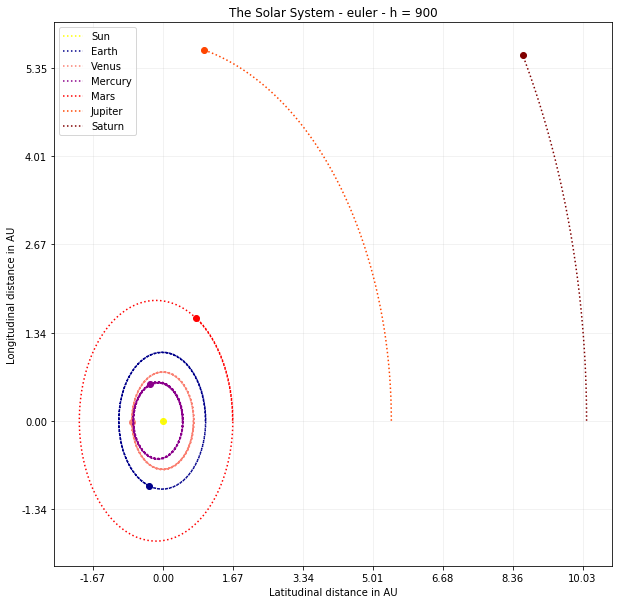

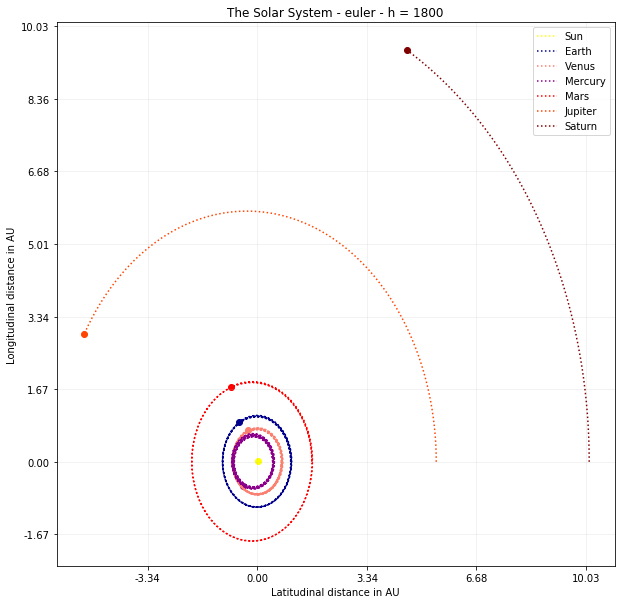

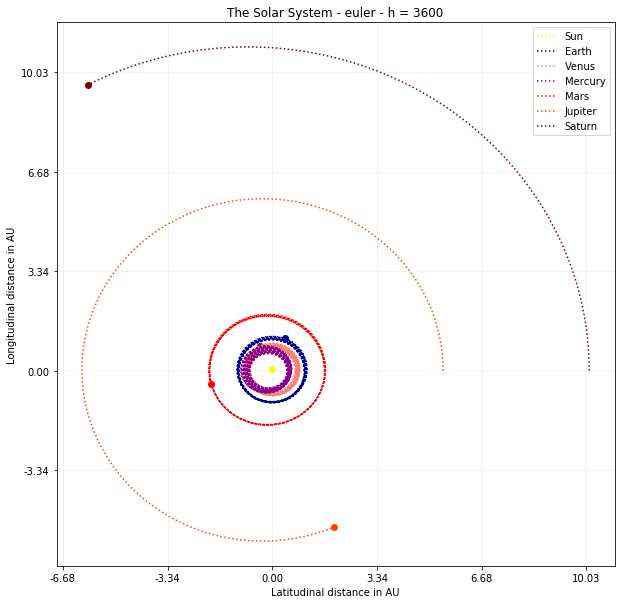

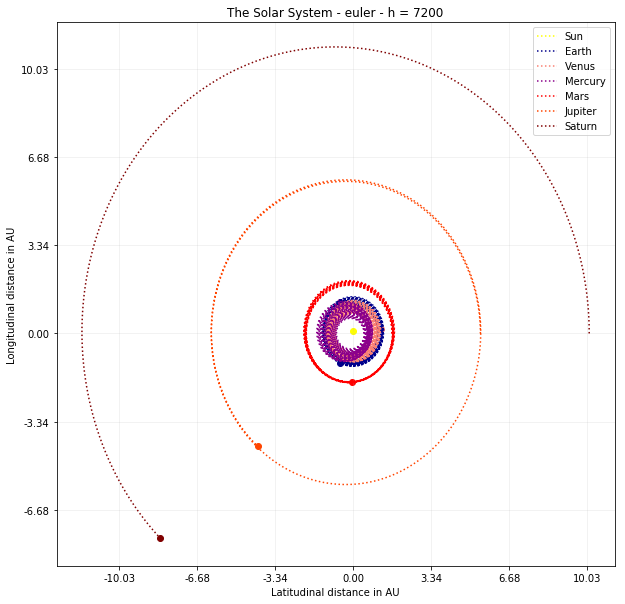

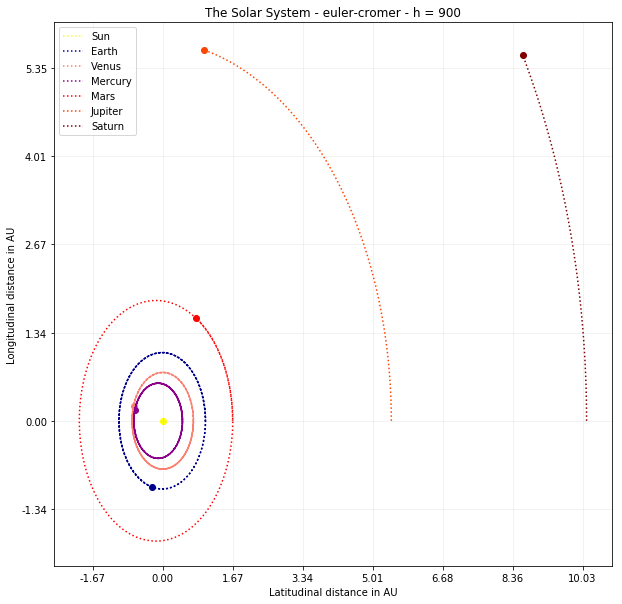

...

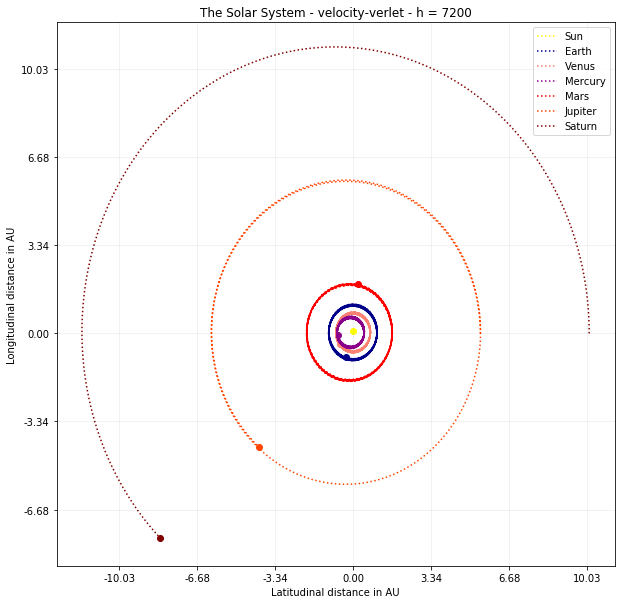

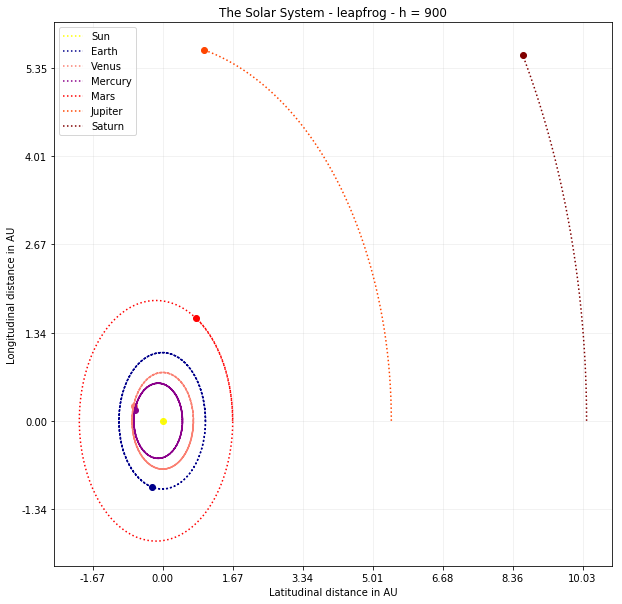

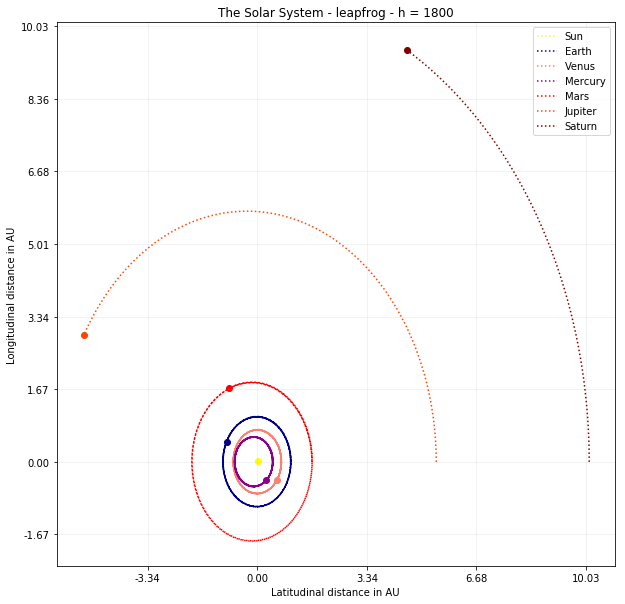

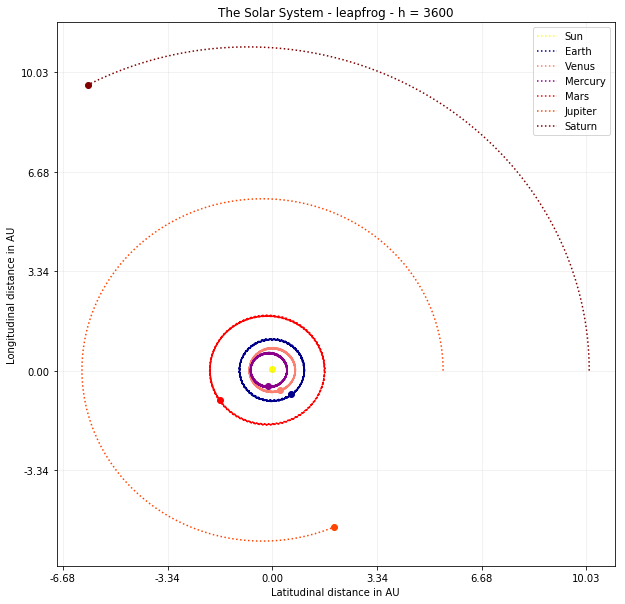

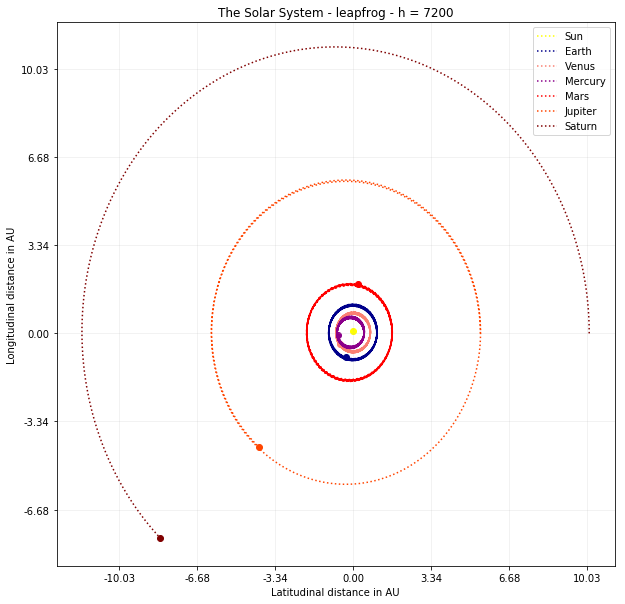

In [67]:
big_plotter(methods = m, steps = hs, graph = ['orbit'], opt = [[sun, earth, venus, mercury, mars, jupiter, saturn], 'The Solar System'])

In [58]:
a = [2,3]

In [59]:
a.index(2)

0